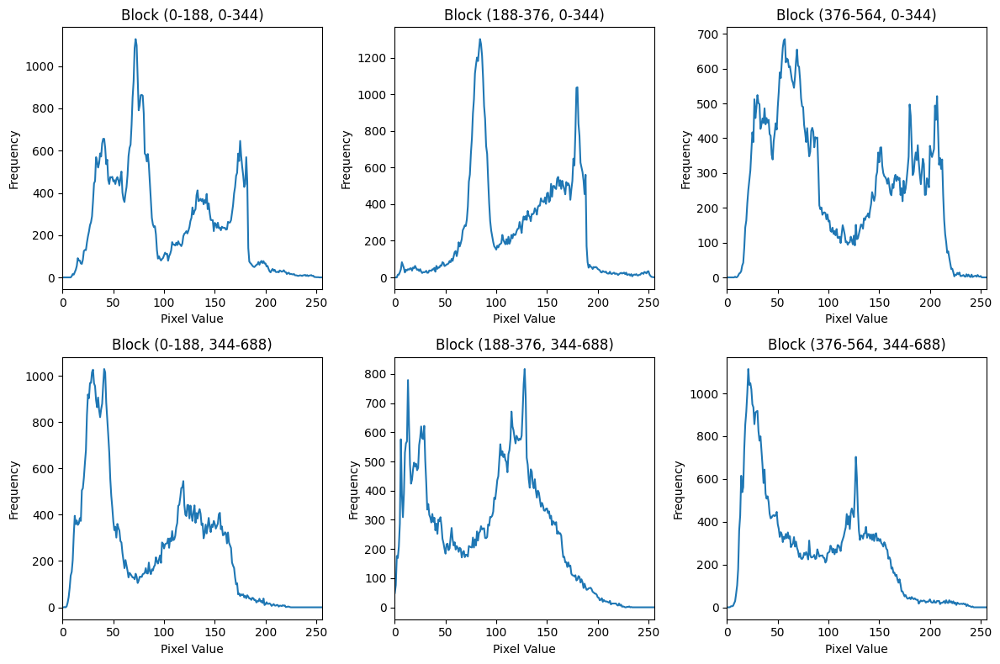

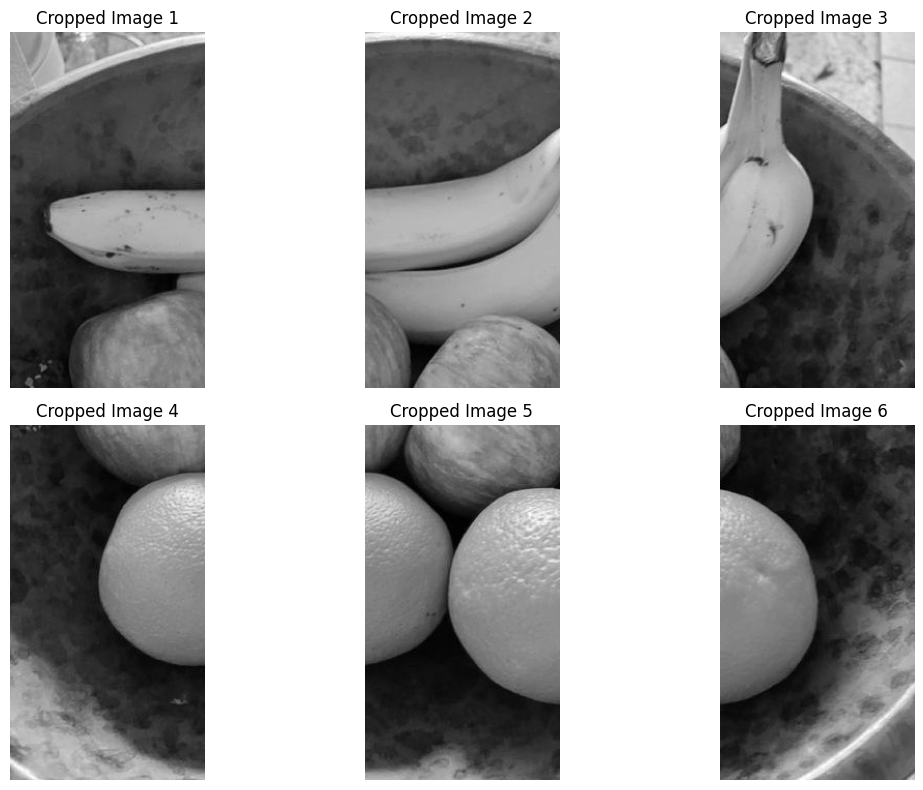

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('./app_ban_oran.jpg', cv2.IMREAD_GRAYSCALE)

# Define the number of blocks (e.g., 6)
num_blocks = 6

# Calculate the block size based on the number of blocks
block_width = image.shape[1] // 3  # 3 blocks per row
block_height = image.shape[0] // (num_blocks // 3)  # 2 rows

# Create a figure for the grid of histograms
plt.figure(figsize=(12, 8))  # Adjust the figure size as needed

# Create a list to store the cropped images
cropped_images = []

# Loop through the image in blocks
for i in range(num_blocks):
    # Calculate row and column indices for the current block
    row_index = i // 3
    col_index = i % 3

    # Calculate the region of interest (ROI) for the current block
    x_start = col_index * block_width
    x_end = (col_index + 1) * block_width
    y_start = row_index * block_height
    y_end = (row_index + 1) * block_height
    roi = image[y_start:y_end, x_start:x_end]

    # Calculate the histogram for the ROI
    hist = cv2.calcHist([roi], [0], None, [256], [0, 256])

    # Determine the subplot position for the current block's histogram
    subplot_num = i + 1

    # Create a subplot for the current block's histogram
    plt.subplot(2, 3, subplot_num)
    plt.title(f'Block ({x_start}-{x_end}, {y_start}-{y_end})')
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

    # Append the cropped image to the list
    cropped_images.append(roi)

# Adjust spacing between subplots
plt.tight_layout()

# Show the grid of histograms
plt.show()

# Display the cropped images in a separate figure
plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
for i, img in enumerate(cropped_images):
    plt.subplot(2, 3, i + 1)
    plt.title(f'Cropped Image {i + 1}')
    plt.imshow(img, cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()


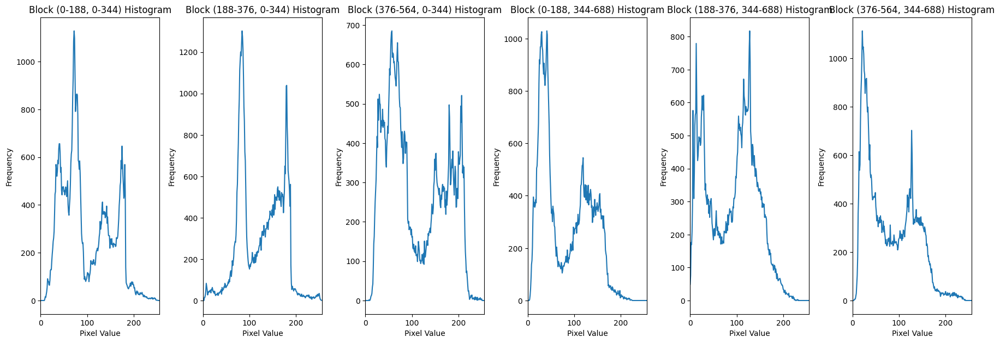

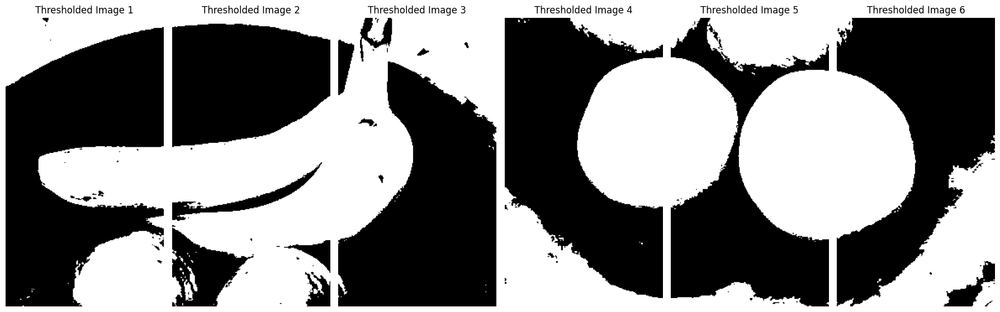

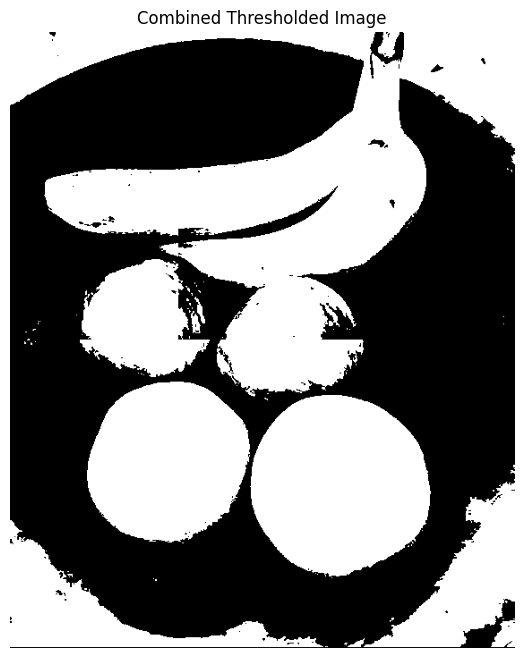

In [5]:

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('./app_ban_oran.jpg', cv2.IMREAD_GRAYSCALE)

# Define the number of blocks (e.g., 6)
num_blocks = 6

# Calculate the block size based on the number of blocks
block_width = image.shape[1] // 3  # 3 blocks per row
block_height = image.shape[0] // (num_blocks // 3)  # 2 rows

# Create a figure for the grid of histograms, original images, and thresholded images
plt.figure(figsize=(18, 12))  # Adjust the figure size as needed

# Create lists to store the cropped images, histograms, and thresholded images
cropped_images = []
histograms = []
thresholded_images = []

# Loop through the image in blocks
for i in range(num_blocks):
    # Calculate row and column indices for the current block
    row_index = i // 3
    col_index = i % 3

    # Calculate the region of interest (ROI) for the current block
    x_start = col_index * block_width
    x_end = (col_index + 1) * block_width
    y_start = row_index * block_height
    y_end = (row_index + 1) * block_height
    roi = image[y_start:y_end, x_start:x_end]

    # Calculate the histogram for the ROI
    hist = cv2.calcHist([roi], [0], None, [256], [0, 256])

    # Apply Otsu's thresholding method to the current block
    _, thresholded = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Determine the subplot position for the current block's histogram
    subplot_hist_num = i % 6 + 1

    # Create a subplot for the current block's histogram
    plt.subplot(2, 6, subplot_hist_num)
    plt.title(f'Block ({x_start}-{x_end}, {y_start}-{y_end}) Histogram')
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

    # Append the cropped image, histogram, and thresholded image to their respective lists
    cropped_images.append(roi)
    histograms.append(hist)
    thresholded_images.append(thresholded)

# Adjust spacing between subplots
plt.tight_layout()

# Show the grid of histograms
plt.show()

# Display the thresholded images in a separate figure
plt.figure(figsize=(18, 12))  # Adjust the figure size as needed
for i, thresholded_img in enumerate(thresholded_images):
    plt.subplot(2, 6, i + 1)
    plt.title(f'Thresholded Image {i + 1}')
    plt.imshow(thresholded_img, cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()


# Create a whole image from the thresholded blocks
thresholded_image_combined = np.zeros_like(image)
for i, thresholded_img in enumerate(thresholded_images):
    row_index = i // 3
    col_index = i % 3
    x_start = col_index * block_width
    y_start = row_index * block_height
    thresholded_image_combined[y_start:y_start+block_height, x_start:x_start+block_width] = thresholded_img

# Display the thresholded images in a separate figure
plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
plt.imshow(thresholded_image_combined, cmap='gray')
plt.title('Combined Thresholded Image')
plt.axis('off')
plt.show()



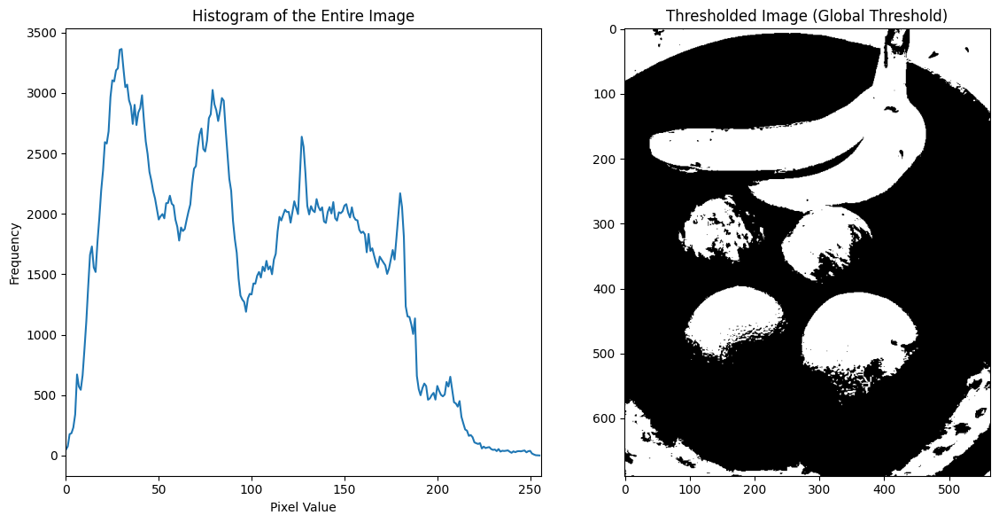

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('./app_ban_oran.jpg', cv2.IMREAD_GRAYSCALE)

# Calculate the histogram for the entire image
hist = cv2.calcHist([image], [0], None, [256], [0, 256])

# Create a figure for the histogram and thresholded image
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

# Plot the histogram
plt.subplot(1, 2, 1)
plt.plot(hist)
plt.xlim([0, 256])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram of the Entire Image')

# Thresholding: Choose a threshold value (e.g., 128)
threshold_value = 128

# Apply binary thresholding to the entire image
_, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

# Plot the thresholded image
plt.subplot(1, 2, 2)
plt.imshow(thresholded_image, cmap='gray')
plt.title('Thresholded Image (Global Threshold)')

# Show the histogram and thresholded image
plt.tight_layout()
plt.show()


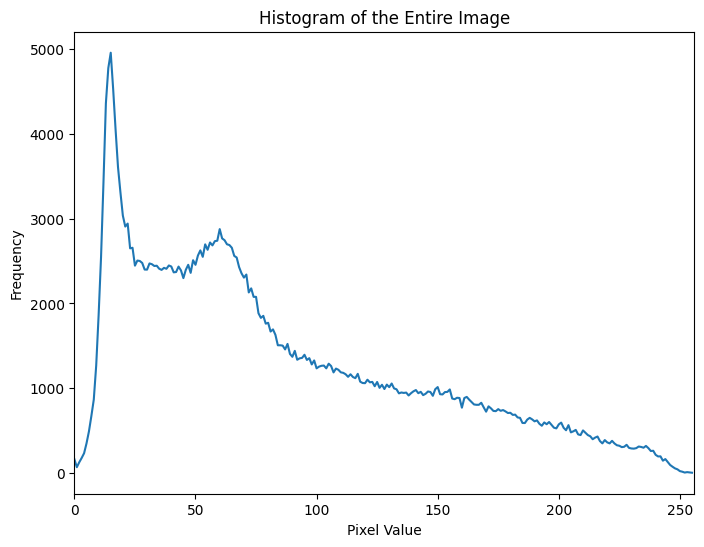

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('./six_colors.jpg', cv2.IMREAD_GRAYSCALE)

# Calculate the histogram for the entire image
hist = cv2.calcHist([image], [0], None, [256], [0, 256])

# Create a figure for the histogram
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

# Plot the histogram
plt.plot(hist)
plt.xlim([0, 256])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram of the Entire Image')

# Show the histogram
plt.show()


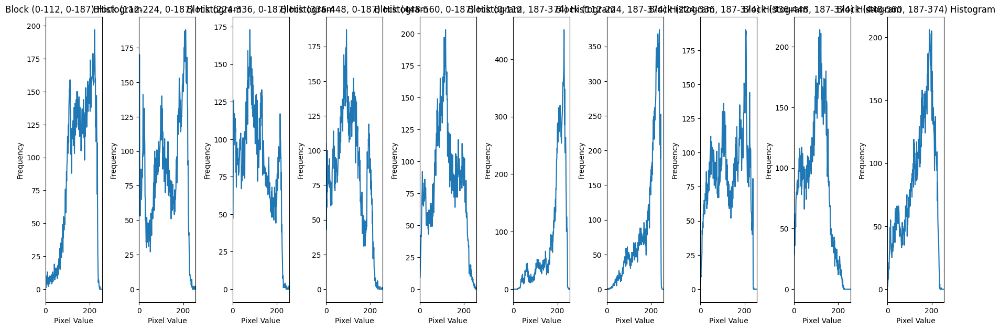

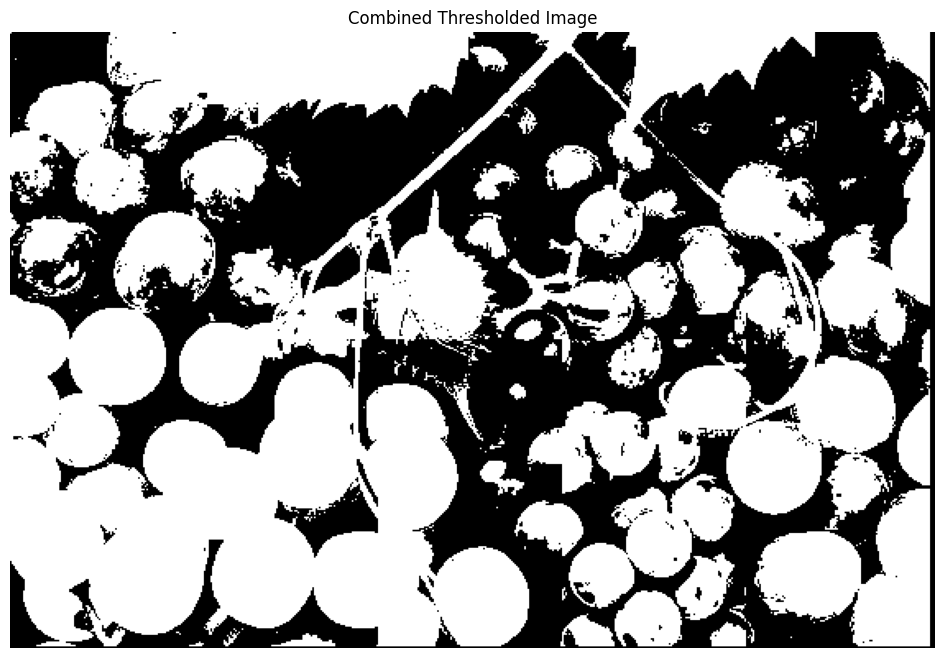

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('./grapes_close.jpg', cv2.IMREAD_GRAYSCALE)

# Define the number of blocks (e.g., 10)
num_blocks = 10

# Calculate the block size based on the number of blocks
block_width = image.shape[1] // 5  # 5 blocks per row
block_height = image.shape[0] // (num_blocks // 5)  # 2 rows

# Create a figure for the grid of histograms, original images, and thresholded images
plt.figure(figsize=(18, 12))  # Adjust the figure size as needed

# Create lists to store the cropped images, histograms, and thresholded images
cropped_images = []
histograms = []
thresholded_images = []

# Loop through the image in blocks
for i in range(num_blocks):
    # Calculate row and column indices for the current block
    row_index = i // 5
    col_index = i % 5

    # Calculate the region of interest (ROI) for the current block
    x_start = col_index * block_width
    x_end = (col_index + 1) * block_width
    y_start = row_index * block_height
    y_end = (row_index + 1) * block_height
    roi = image[y_start:y_end, x_start:x_end]

    # Calculate the histogram for the ROI
    hist = cv2.calcHist([roi], [0], None, [256], [0, 256])

    # Apply Otsu's thresholding method to the current block
    _, thresholded = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Determine the subplot position for the current block's histogram
    subplot_hist_num = i % 10 + 1

    # Create a subplot for the current block's histogram
    plt.subplot(2, 10, subplot_hist_num)
    plt.title(f'Block ({x_start}-{x_end}, {y_start}-{y_end}) Histogram')
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

    # Append the cropped image, histogram, and thresholded image to their respective lists
    cropped_images.append(roi)
    histograms.append(hist)
    thresholded_images.append(thresholded)

# Adjust spacing between subplots
plt.tight_layout()

# Show the grid of histograms
plt.show()

# Create a whole image from the thresholded blocks
thresholded_image_combined = np.zeros_like(image)
for i, thresholded_img in enumerate(thresholded_images):
    row_index = i // 5
    col_index = i % 5
    x_start = col_index * block_width
    y_start = row_index * block_height
    thresholded_image_combined[y_start:y_start+block_height, x_start:x_start+block_width] = thresholded_img

# Display the thresholded images in a separate figure
plt.figure(figsize=(12, 8))  # Adjust the figure size as needed
plt.imshow(thresholded_image_combined, cmap='gray')
plt.title('Combined Thresholded Image')
plt.axis('off')
plt.show()


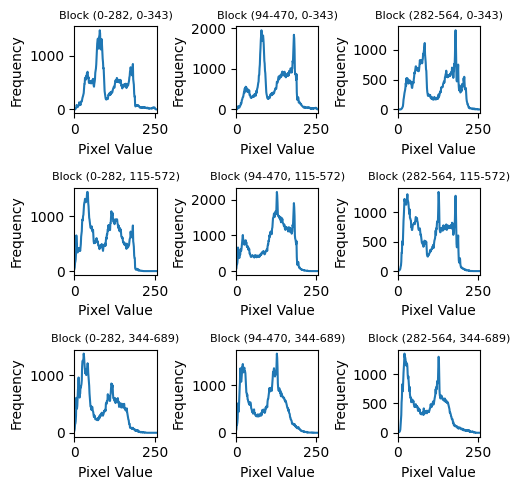

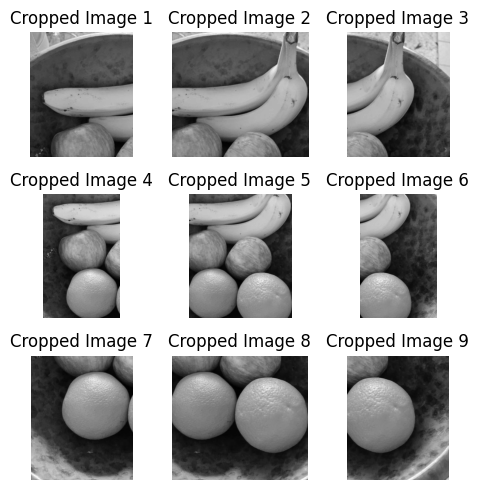

In [133]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('./app_ban_oran.jpg', cv2.IMREAD_GRAYSCALE)

# Define the number of blocks (7x7)
num_blocks_x = 3
num_blocks_y = 3

# Calculate the block size and overlap
block_width = image.shape[1] // num_blocks_x
block_height = image.shape[0] // num_blocks_y
overlap_x = block_width // 2
overlap_y = block_height // 2

# Create a figure for the grid of histograms
plt.figure(figsize=(5, 5))  # Adjust the figure size as needed

# Create a list to store the cropped images
cropped_images = []

# Loop through the image with overlapping blocks
for i in range(num_blocks_y):
    for j in range(num_blocks_x):
        # Calculate the coordinates for the current block
        x_start = j * block_width - overlap_x
        x_end = (j + 1) * block_width + overlap_x
        y_start = i * block_height - overlap_y
        y_end = (i + 1) * block_height + overlap_y

        # Ensure the coordinates are within the image bounds
        x_start = max(0, x_start)
        x_end = min(image.shape[1], x_end)
        y_start = max(0, y_start)
        y_end = min(image.shape[0], y_end)

        # Crop the current block from the image
        block = image[y_start:y_end, x_start:x_end]

        # Calculate the histogram for the block
        hist = cv2.calcHist([block], [0], None, [256], [0, 256])

        # Determine the subplot position for the current block's histogram
        subplot_num = i * num_blocks_x + j + 1

        # Create a subplot for the current block's histogram
        plt.subplot(num_blocks_y, num_blocks_x, subplot_num )
        plt.title(f'Block ({x_start}-{x_end}, {y_start}-{y_end})', fontsize=8)  # Adjust fontsize as needed
        plt.plot(hist)
        plt.xlim([0, 256])
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')

        # Append the cropped image to the list
        cropped_images.append(block)

# Adjust spacing between subplots
plt.tight_layout()

# Show the grid of histograms
plt.show()

# Display the cropped images in a separate figure
plt.figure(figsize=(5, 5))  # Adjust the figure size as needed
for i, img in enumerate(cropped_images):
    plt.subplot(num_blocks_y, num_blocks_x, i + 1)
    plt.title(f'Cropped Image {i + 1}')
    plt.imshow(img, cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()


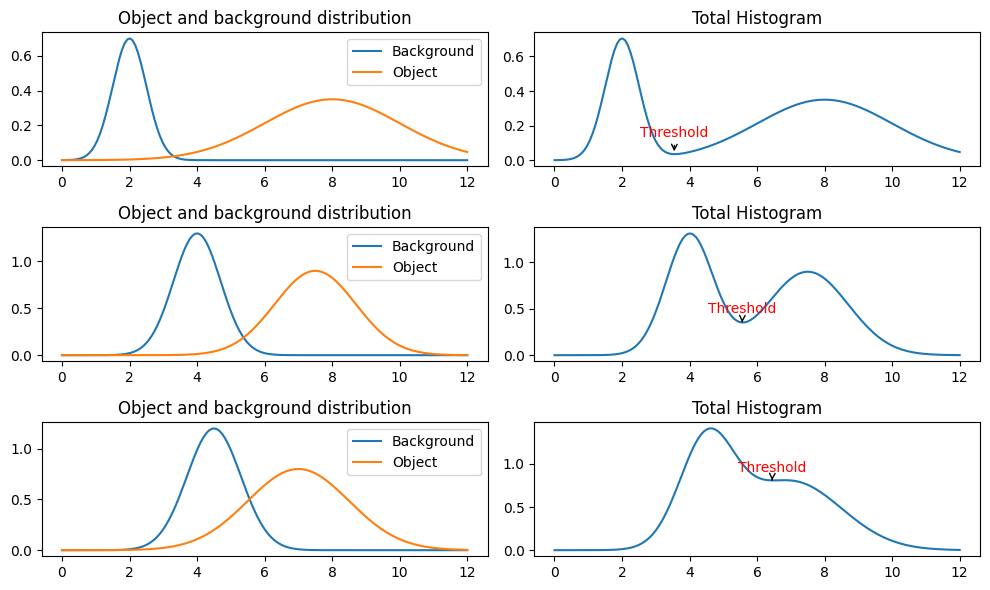

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Generate Gaussian distribution
def gaussian(x, mu, sig, amplitude=1):
    return amplitude * np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

x_values = np.linspace(0, 12, 150)

fig, axs = plt.subplots(3, 2, figsize=(10, 6))

# Panel A plots
# Diagram 1
axs[0, 0].plot(x_values, gaussian(x_values, 2, 0.5, 0.7), label='Background')
axs[0, 0].plot(x_values, gaussian(x_values, 8, 2, 0.35), label='Object')
axs[0, 0].set_title('Object and background distribution')
axs[0, 0].legend()

# Diagram 2
axs[1, 0].plot(x_values, gaussian(x_values, 4, 0.7, 1.3), label='Background')
axs[1, 0].plot(x_values, gaussian(x_values, 7.5, 1.2, 0.9), label='Object')
axs[1, 0].set_title('Object and background distribution')
axs[1, 0].legend()

# Diagram 3
axs[2, 0].plot(x_values, gaussian(x_values, 4.5, 0.8, 1.2), label='Background')
axs[2, 0].plot(x_values, gaussian(x_values, 7, 1.5, 0.8), label='Object')
axs[2, 0].set_title('Object and background distribution')
axs[2, 0].legend()

# Panel B plots
summed_distributions = [
    gaussian(x_values, 2, 0.5, 0.7) + gaussian(x_values, 8, 2, 0.35),
    gaussian(x_values, 4, 0.7, 1.3) + gaussian(x_values, 7.5, 1.2, 0.9),
    gaussian(x_values, 4.5, 0.8, 1.2) + gaussian(x_values, 7, 1.5, 0.8)
]

for i, summed_distribution in enumerate(summed_distributions):
    axs[i, 1].plot(x_values, summed_distribution)
    
    # Find valleys
    gradient = np.gradient(summed_distribution)
    valleys = np.where(np.diff(np.sign(gradient)) > 0)[0]
    for valley in valleys:
        axs[i, 1].annotate('Threshold', color="red", xy=(x_values[valley], summed_distribution[valley]),
                           xytext=(x_values[valley]-1, summed_distribution[valley]+0.1),
                           arrowprops=dict(facecolor='black', arrowstyle='->'))

    axs[i, 1].set_title('Total Histogram')

plt.tight_layout()
plt.show()


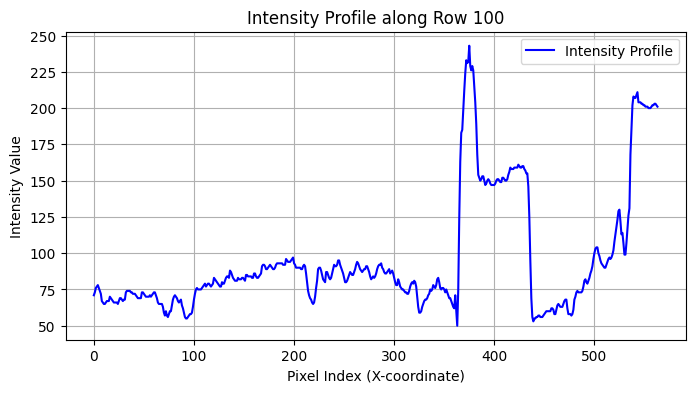

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image (replace 'your_image.jpg' with the image path)
image = cv2.imread('./app_ban_oran.jpg', cv2.IMREAD_GRAYSCALE)

# Define the horizontal line for the intensity profile
row_index = 100  # Replace with the desired row index
intensity_profile = image[row_index, :]

# Create x-coordinates for plotting (pixel indices)
x_coordinates = np.arange(0, image.shape[1])

# Create a figure for the intensity profile
plt.figure(figsize=(8, 4))

# Plot the intensity profile
plt.plot(x_coordinates, intensity_profile, color='b', label='Intensity Profile')
plt.xlabel('Pixel Index (X-coordinate)')
plt.ylabel('Intensity Value')
plt.title('Intensity Profile along Row {}'.format(row_index))
plt.legend()
plt.grid()

# Show the plot
plt.show()


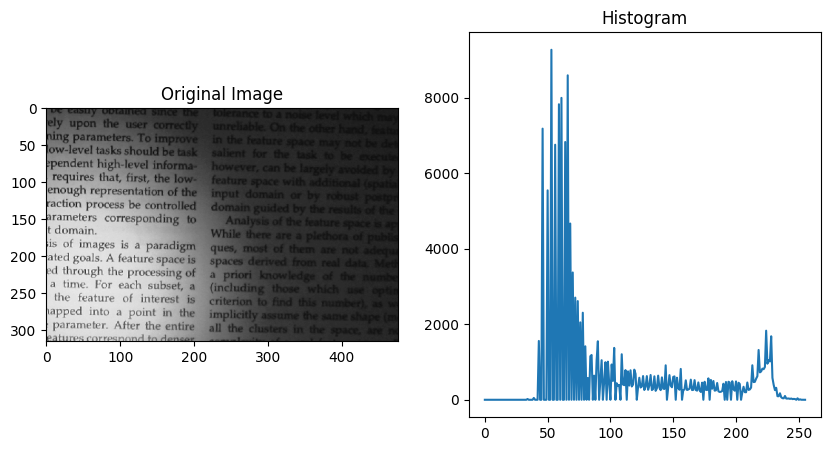

In [124]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale mode
image = cv2.imread('shadowed_text_1.jpg', cv2.IMREAD_GRAYSCALE)

# Compute the histogram
hist = cv2.calcHist([image], [0], None, [256], [0,256])

# Plot the histogram
plt.figure(figsize=(10,5))
plt.subplot(1,2,1), plt.imshow(image, cmap='gray'), plt.title('Original Image')
plt.subplot(1,2,2), plt.plot(hist), plt.title('Histogram')
plt.show()


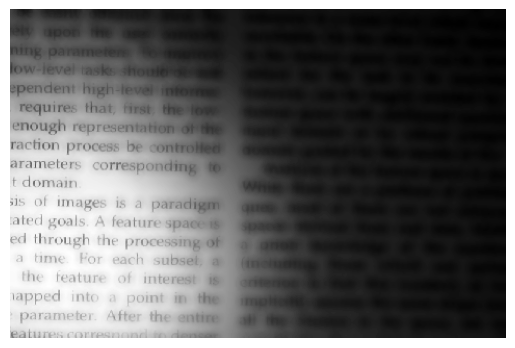

In [125]:
def bilateral_filter(image, d=15, sigmaColor=75, sigmaSpace=75):
    return cv2.bilateralFilter(image, d, sigmaColor, sigmaSpace)


filtered_image=bilateral_filter(image)


plt.imshow(filtered_image, cmap='gray')
plt.axis('off')
plt.show()

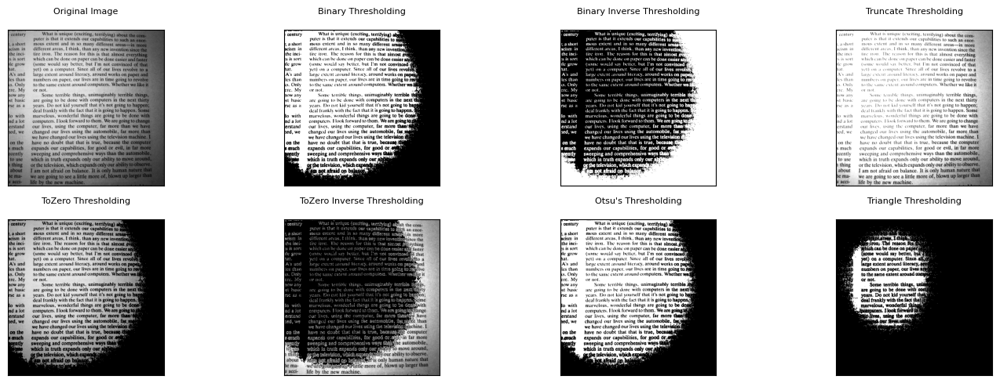

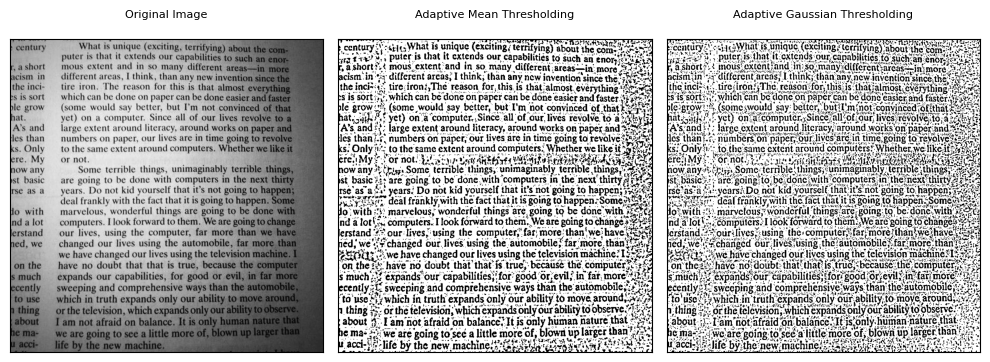

In [225]:
import cv2
from matplotlib import pyplot as plt

# Load image
image_path = "./shadowed_text_2.jpg"
img = cv2.imread(image_path, 0)

# Define methods
global_methods = [
    ("Binary Thresholding", cv2.THRESH_BINARY),
    ("Binary Inverse Thresholding", cv2.THRESH_BINARY_INV),
    ("Truncate Thresholding", cv2.THRESH_TRUNC),
    ("ToZero Thresholding", cv2.THRESH_TOZERO),
    ("ToZero Inverse Thresholding", cv2.THRESH_TOZERO_INV),
    ("Otsu's Thresholding", cv2.THRESH_BINARY + cv2.THRESH_OTSU),
    ("Triangle Thresholding", cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)
]

adaptive_methods = [
    ("Adaptive Mean Thresholding", cv2.ADAPTIVE_THRESH_MEAN_C),
    ("Adaptive Gaussian Thresholding", cv2.ADAPTIVE_THRESH_GAUSSIAN_C)
]

# Apply global thresholding methods
global_images = [img]
global_titles = ["Original Image"]
for title, method in global_methods:
    _, th_img = cv2.threshold(img, 128, 255, method)
    global_images.append(th_img)
    global_titles.append(title)

# Apply adaptive thresholding methods
adaptive_images = [img]
adaptive_titles = ["Original Image"]
for title, method in adaptive_methods:
    th_img = cv2.adaptiveThreshold(img, 255, method, cv2.THRESH_BINARY, 11, 2)
    adaptive_images.append(th_img)
    adaptive_titles.append(title)

# Display the global thresholding images
plt.figure(figsize=(15, 5))  # Adjust based on your screen size
for i in range(len(global_images)):
    plt.subplot(2, 4, i+1)  # 2 rows, 4 columns
    plt.imshow(global_images[i], 'gray')
    plt.title(global_titles[i], fontsize=8, pad=15)
    plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

# Display the adaptive thresholding images
plt.figure(figsize=(10, 5))  # Adjust based on your screen size
for i in range(len(adaptive_images)):
    plt.subplot(1, 3, i+1)  # 1 row, 3 columns
    plt.imshow(adaptive_images[i], 'gray')
    plt.title(adaptive_titles[i], fontsize=8, pad=15)
    plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()


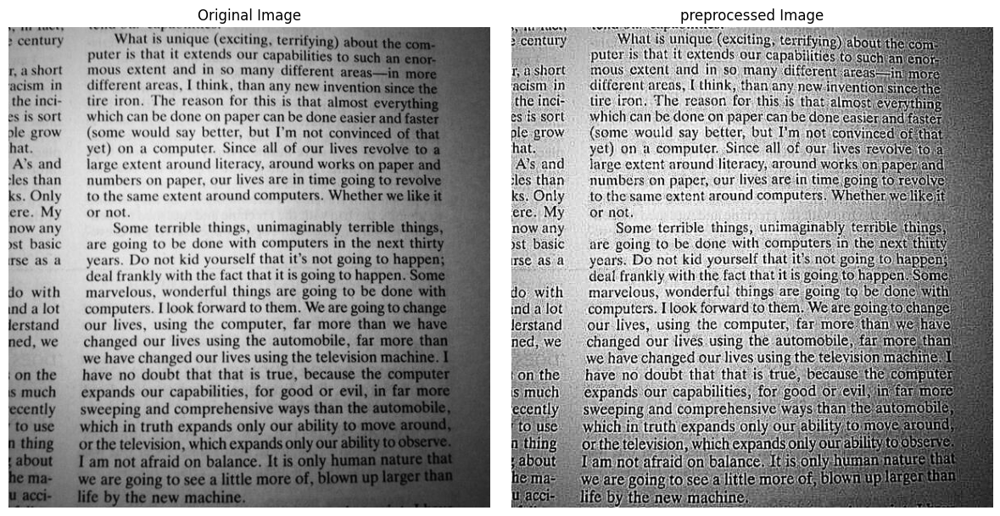

In [224]:
def sharpen_image(image):
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    return cv2.filter2D(image, -1, kernel)

def smooth_image(image):
    return cv2.GaussianBlur(image, (5,5), 0.5)


preprocessed_image=smooth_image(sharpen_image(image))


# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(preprocessed_image, cmap='gray')
plt.title("preprocessed Image")
plt.axis('off')

plt.tight_layout()
plt.show()




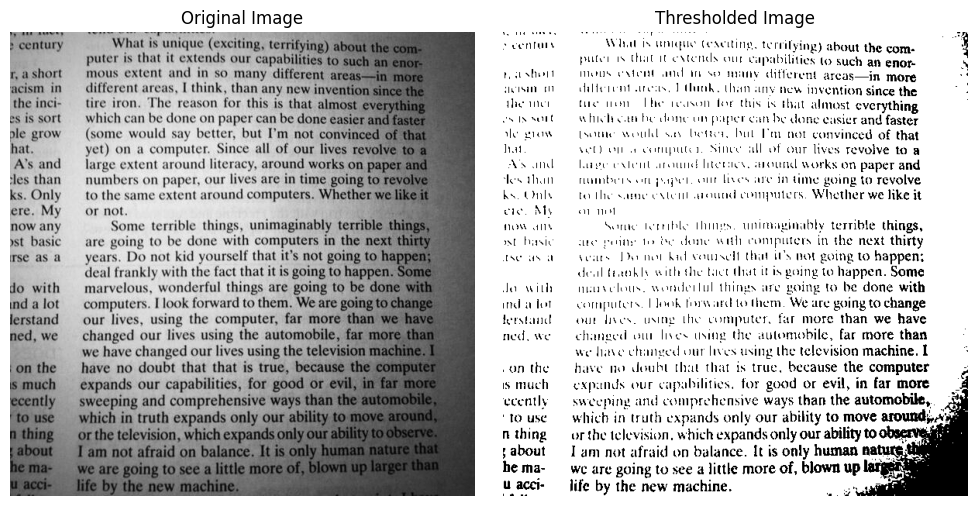

In [222]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
image = cv2.imread('shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)

# Set the global threshold value
threshold_value = 65

# Apply the threshold
_, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

# Display the original and thresholded images side by side
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(thresholded_image, cmap='gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.tight_layout()
plt.show()


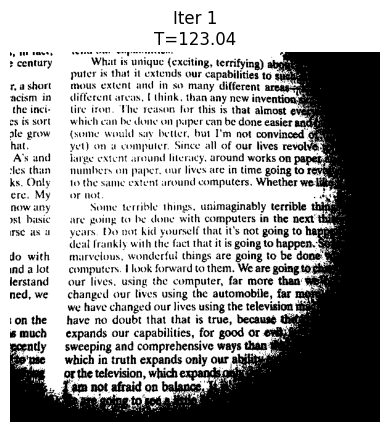

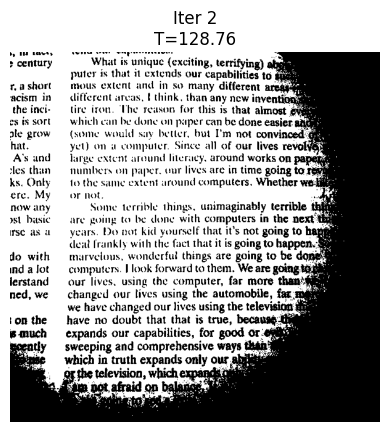

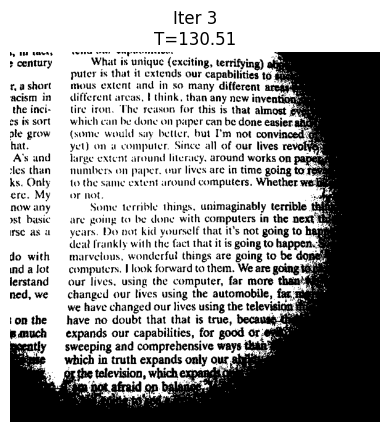

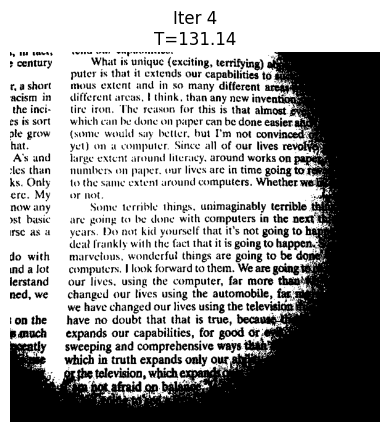

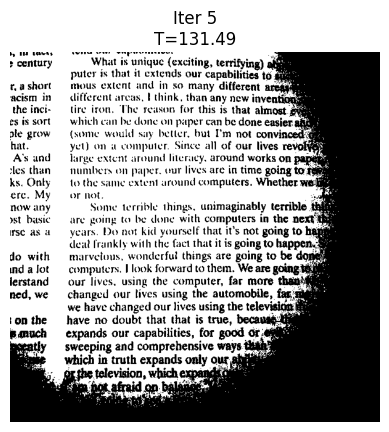

Ridler-Calvard Converged Threshold: 131.14464539903096


In [223]:
ridler_threshold = ridler_calvard_thresholding(image)
print(f'Ridler-Calvard Converged Threshold: {ridler_threshold}')


In [219]:
def ridler_calvard_thresholding(image, max_iterations=100, tolerance=0.5):
    # Initial threshold
    T = np.mean(filtered_image)
    
    for iteration in range(max_iterations):
        # Segment the image
        foreground = filtered_image[filtered_image > T]
        background = filtered_image[filtered_image <= T]
        
        # Calculate new threshold
        new_T = 0.5 * (np.mean(foreground) + np.mean(background))
        
        # Check for empty segments
        if foreground.size == 0 or background.size == 0:
            break
        
        # Display the thresholded image for this iteration
        _, thresholded = cv2.threshold(image, new_T, 255, cv2.THRESH_BINARY)
        
        plt.figure()  # Create a new figure for each iteration
        plt.imshow(thresholded, cmap='gray')
        plt.title(f'Iter {iteration + 1}\nT={new_T:.2f}')
        plt.axis('off')
        plt.show()  # Show the image
        
        # Check for convergence
        if np.abs(new_T - T) < tolerance:
            break
        
        T = new_T
        
    return T


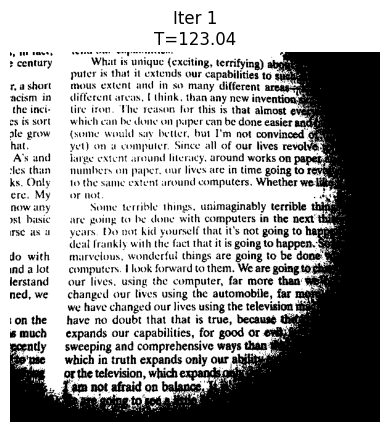

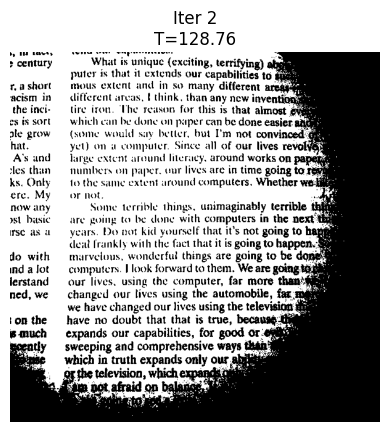

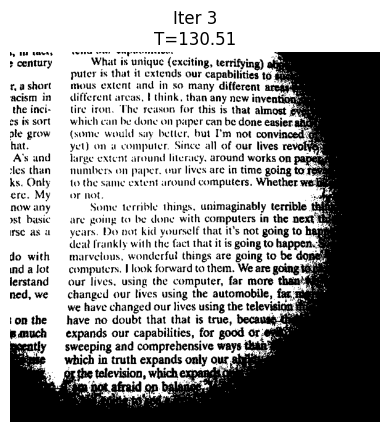

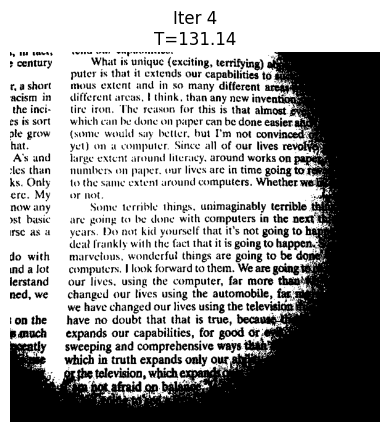

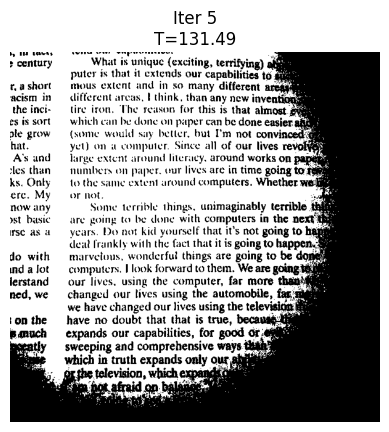

Ridler-Calvard Converged Threshold: 131.14464539903096


In [220]:
ridler_threshold = ridler_calvard_thresholding(image)
print(f'Ridler-Calvard Converged Threshold: {ridler_threshold}')


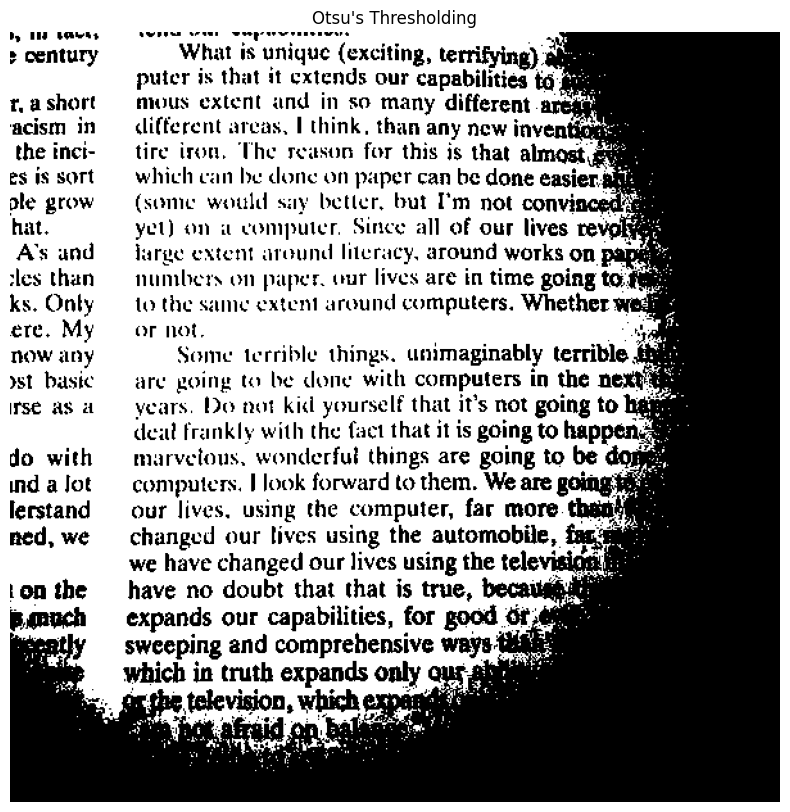

Otsu's threshold value: 134.0


In [218]:
import cv2
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Otsu's thresholding
_, thresholded = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(thresholded, cmap='gray')
plt.title("Otsu's Thresholding")
plt.axis('off')
plt.show()

print(f"Otsu's threshold value: {_}")


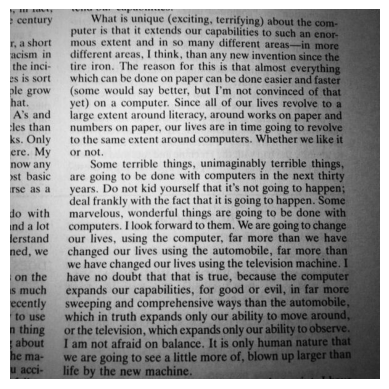

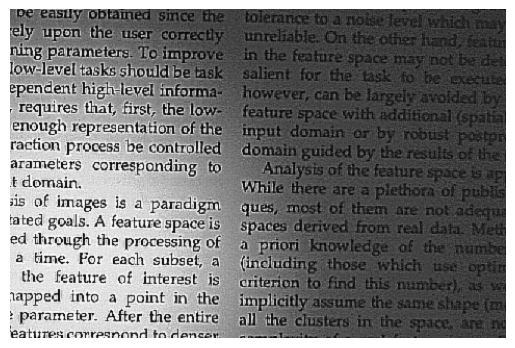

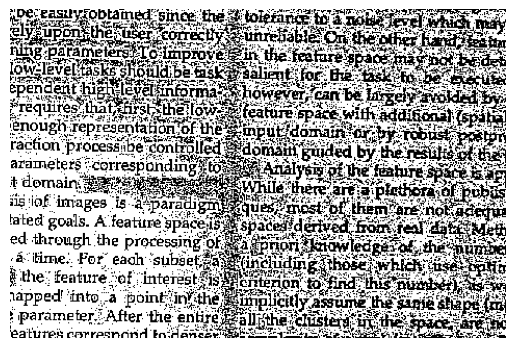

In [217]:
import cv2
import numpy as np


# Load the grayscale image
image = cv2.imread('shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)

def chow_kaneko_threshold(image, window_size=15, k=0.25):
    # Calculate local mean
    mean = cv2.boxFilter(image, ddepth=-1, ksize=(window_size, window_size))

    # Calculate local variance (using E[X^2] - E[X]^2)
    squared = cv2.boxFilter(image**2, ddepth=-1, ksize=(window_size, window_size))
    variance = squared - mean**2
    std_dev = np.sqrt(variance)

    # Set R as half of the max pixel value (128 for 8-bit images)
    R = 128
    
    # Calculate threshold
    threshold = mean - k * (std_dev / R)

    # Apply threshold
    binary_image = np.zeros_like(image, dtype=np.uint8)
    binary_image[image > threshold] = 255

    return binary_image

# Use the method on the image
binary_image = chow_kaneko_threshold(filtered_image)

# Display the original
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()

# Display the preprocessed image
plt.imshow(filtered_image, cmap='gray')
plt.axis('off')
plt.show()

# Display the result
plt.imshow(binary_image, cmap='gray')
plt.axis('off')
plt.show()


In [216]:
import numpy as np
import matplotlib.pyplot as plt

def chow_kaneko_thresholding(image):
    # 1. Logarithmic Transform
    log_image = np.log1p(image.astype(np.float32))

    # 2. Computation of Histogram for the Entire Region
    histogram, _ = np.histogram(log_image.ravel(), 256, [0,256])
    
    # 3. Determination of Threshold, V0
    V0 = np.mean(log_image)

    # 4. Compute Local Histograms for 49 regions & variances
    # Assuming the image can be divided into a 7x7 grid
    regions = []
    h, w = image.shape
    h_step, w_step = h // 7, w // 7
    variances = []
    for i in range(7):
        for j in range(7):
            region = log_image[i*h_step:(i+1)*h_step, j*w_step:(j+1)*w_step]
            regions.append(region)
            variances.append(np.var(region))
    
    # 5. Curve Fitting (Estimation of Parameters) & Bimodality Test
    region_thresholds = []
    for region, variance in zip(regions, variances):
        if variance > 2 * V0:
            threshold = np.mean(region)
            region_thresholds.append(threshold)
        else:
            region_thresholds.append(None)

    # Convert None values to np.nan and reshape
    region_thresholds = np.asarray(region_thresholds, dtype=float).reshape(7, 7)

    # 6 & 7. Regionwise & Pointwise Interpolation
    interpolated_thresholds = region_thresholds.copy()

    for i in range(7):
        for j in range(7):
            if np.isnan(interpolated_thresholds[i,j]):
                neighbors = []
                if i > 0:
                    neighbors.append(interpolated_thresholds[i-1,j])
                if i < 6:
                    neighbors.append(interpolated_thresholds[i+1,j])
                if j > 0:
                    neighbors.append(interpolated_thresholds[i,j-1])
                if j < 6:
                    neighbors.append(interpolated_thresholds[i,j+1])
                neighbors = [val for val in neighbors if not np.isnan(val)]
                interpolated_thresholds[i,j] = np.nanmean(neighbors) if neighbors else V0



    interpolated_thresholds = np.kron(interpolated_thresholds, np.ones((h_step, w_step)))
    pad_height = h - interpolated_thresholds.shape[0]
    pad_width = w - interpolated_thresholds.shape[1]
    interpolated_thresholds = np.pad(interpolated_thresholds, ((0, pad_height), (0, pad_width)), mode='edge')
    
    # 8. Binary Decision
    binary_output = np.where(log_image > interpolated_thresholds, 255, 0).astype(np.uint8)
    
    return binary_output






Peak indices for the first region: [169 176]
Threshold values for each region:
[[ -5.18893733  -4.90383251  -1.97164466   2.67715856   4.11288745
   -2.3076749   -9.62250108]
 [  1.92210608  -1.76266936  -2.87161625   2.3999951    4.74732805
    3.73624526   2.94794059]
 [ -1.1670458    2.83332818  -6.93876236   1.15123937  -5.94558115
    4.42706366   3.78709451]
 [-13.25492049   6.8151323   -5.83522901   1.73863305  -2.07879869
    1.62938684 -14.45862089]
 [ -1.35999644   1.83013968  -3.58313093  -3.17163456   3.64284618
    3.82020497 -10.75286803]
 [ -3.48121373  13.38188218   1.40495475  -5.37648805   7.96871457
  -13.6163863   -5.46418296]
 [  5.64155221  -9.25397675   1.86812263   2.26665017  -5.63529571
  -19.21199482   9.02628791]]


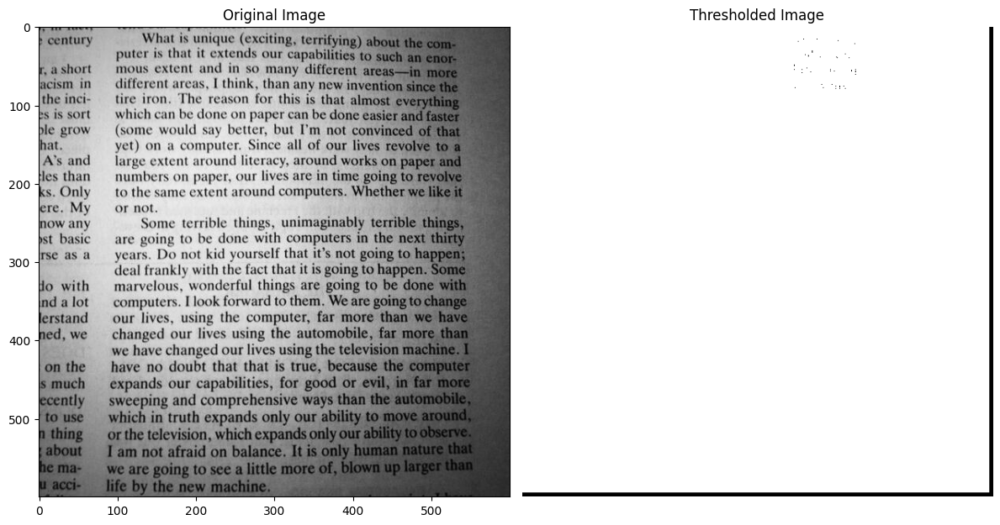

In [215]:

# Load the image
image_path = './shadowed_text_2.jpg'  # Replace with your image path
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# Apply the Chow-Kaneko thresholding method
binary_output = chow_kaneko_thresholding(image)

# Display the original and thresholded images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(binary_output, cmap='gray')
plt.title('Thresholded Image')
plt.axis('off')
plt.tight_layout()
plt.show()

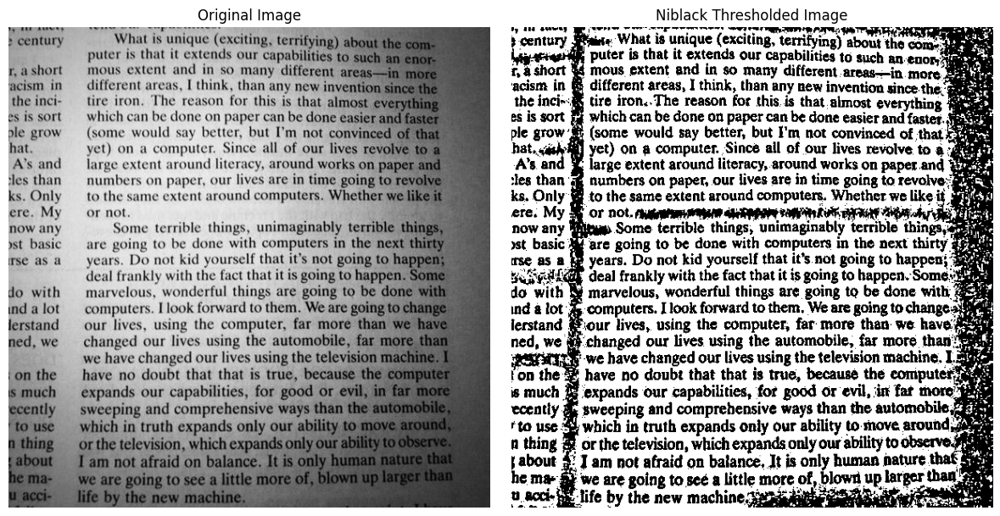

In [214]:
import cv2
import numpy as np


# Load the grayscale image
image = cv2.imread('shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)

# def sharpen_image(image):
#     kernel = np.array([[-1, -1, -1],
#                        [-1,  9, -1],
#                        [-1, -1, -1]])
#     return cv2.filter2D(image, -1, kernel)

# def smooth_image(image):
#     return cv2.GaussianBlur(image, (5,5), 0)




def niblack_threshold(image, window_size=20, k=0.2):
    # Calculate local mean
    mean = cv2.boxFilter(image, ddepth=-1, ksize=(window_size, window_size))

    # Calculate local variance (using E[X^2] - E[X]^2)
    squared = cv2.boxFilter(image**2, ddepth=-1, ksize=(window_size, window_size))
    variance = squared - mean**2
    std_dev = np.sqrt(variance)

    # Calculate threshold
    threshold = mean + k * std_dev

    # Apply threshold
    binary_image = np.zeros_like(image, dtype=np.uint8)
    binary_image[image > threshold] = 255

    return binary_image

# Use the method on the image
binary_image = niblack_threshold(image)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_image, cmap='gray')
plt.title("Niblack Thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()



In [108]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import curve_fit
from skimage import io, color, filters, measure, feature

# Helper function to apply preprocessing steps
def preprocess_image(image):
    # Apply logarithmic transform, subtraction, and averaging
    # These would need to be defined based on specific details of the preprocessing steps
    preprocessed_image = np.log(image)
    # ... other preprocessing steps ...
    return preprocessed_image

# Function to divide the image into overlapping regions
def divide_into_regions(image, region_size, overlap):
    regions = []
    step_size = int(region_size * (1 - overlap))
    for i in range(0, image.shape[0] - region_size + 1, step_size):
        for j in range(0, image.shape[1] - region_size + 1, step_size):
            regions.append(image[i:i+region_size, j:j+region_size])
    return regions

# Function to compute histograms for each region
def compute_histograms(regions, bins):
    histograms = [np.histogram(region.flatten(), bins=bins, range=(0, 1))[0] for region in regions]
    return histograms

# Function to select histograms with large variances (Placeholder for actual selection method)
def select_histograms(histograms):
    selected_histograms = [h for h in histograms if np.var(h) > np.mean([np.var(h) for h in histograms])]
    return selected_histograms

# Function to fit the histogram to a mixture of two Gaussians (Placeholder for actual fitting method)
def fit_mixture_of_gaussians(histogram, bins):
    # Define the model for a mixture of two Gaussians
    def mixture_model(x, w, mu1, sigma1, mu2, sigma2):
        return w*norm.pdf(x, mu1, sigma1) + (1-w)*norm.pdf(x, mu2, sigma2)

    # Initial guess for the parameters
    guess = [0.5, 0.25, 0.1, 0.75, 0.1]

    # Fit the model to the histogram data
    params, _ = curve_fit(mixture_model, bins[:-1], histogram, p0=guess)
    return params

# Function to calculate thresholds from the estimated distributions (Placeholder for actual calculation method)
def calculate_thresholds(distributions):
    # Placeholder for threshold calculation based on the fitted Gaussian parameters
    thresholds = [dist[1] for dist in distributions]  # Using mean of the first Gaussian as a placeholder
    return thresholds

# Function to interpolate thresholds for all image points (Placeholder for actual interpolation method)
def interpolate_thresholds(thresholds, image_shape):
    # Placeholder for actual interpolation code
    interpolated_thresholds = np.zeros(image_shape)
    # ... interpolation code ...
    return interpolated_thresholds

# Function to apply binary decision based on thresholds
def apply_threshold(image, thresholds):
    binary_image = image < thresholds
    return binary_image

# Assemble the full workflow
def chow_kaneko_boundary_detection(image_path):
    # Read and preprocess the image
    image = io.imread(image_path, as_gray=True)
    preprocessed_image = preprocess_image(image)

    # Divide the image into regions
    region_size = 64  # Placeholder for actual size
    overlap = 0.5  # 50% overlap
    regions = divide_into_regions(preprocessed_image, region_size, overlap)

    # Compute histograms for each region
    bins = 50  # Placeholder for actual number of bins
    histograms = compute_histograms(regions, bins)

    # Select histograms with large variances
    selected_histograms = select_histograms(histograms)

    # Estimate the component distributions and coefficients of mixture
    distributions = [fit_mixture_of_gaussians(histogram, np.linspace(0, 1, bins+1)) for histogram in selected_histograms]

    # Calculate thresholds from the estimated distributions
    thresholds = calculate_thresholds(distributions)

    # Interpolate to calculate thresholds for all image points
    interpolated_thresholds = interpolate_thresholds(thresholds, preprocessed_image.shape)

    # Apply binary decision based on the interpolated thresholds
    binary_image = apply_threshold(preprocessed_image, interpolated_thresholds)

    return binary_image

# Example usage (Placeholder for actual image path)
image_path = 'C:\\Users\\Sarvi\\Documents\\UiS\\3rd-semester\\image-processing-ele510\\shadowed_object_1.jpg'
binary_image = chow_kaneko_boundary_detection(image_path)

# Display the result (Placeholder for actual display code)
plt.imshow(binary_image, cmap='gray')
plt.title('Boundary Detected Image')
plt.axis('off')
plt.show()


C:\Users\Sarvi\AppData\Local\Temp\ipykernel_34580\1790126951.py:11: RuntimeWarning: divide by zero encountered in log
  preprocessed_image = np.log(image)


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1200.

Peak indices for the first region: [76 73]
Threshold values for each region:
[[   5.16883194  134.20294898  -13.07374797  -39.56562171  -21.24781031
    -7.39073195  -16.71964889]
 [  -3.42276198   10.40656377    0.          -23.89757577  -33.05130834
   -16.71964889    9.27159657]
 [ -11.85809722  -19.12057234  -13.07374797  -25.48946037   -6.2703365
   -10.40656377  -11.85809722]
 [  15.44929952 -134.37937447   -8.29248077    4.51314408   -5.99969389
     8.09448597  -17.57846942]
 [  13.18820694   77.16563444   90.17727956  140.46076632    7.84546907
     9.6213778   -18.21046286]
 [  17.38304019  -40.5602628     0.          -11.33126768   12.74869204
   -10.40656377   13.07374797]
 [ -25.48946037  -17.57846942  -13.07374797   13.07374797  -15.93494193
   -13.07374797  -24.54071683]]


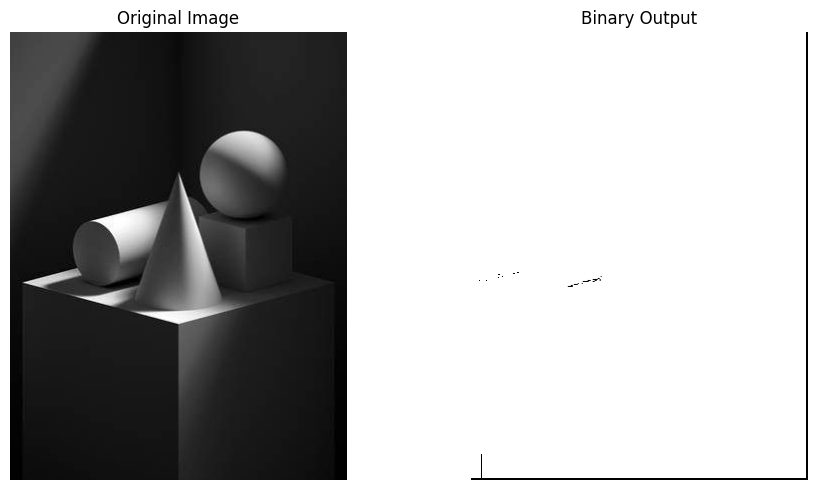

In [209]:
import cv2
import numpy as np


def find_peaks(hist):
    # Smooth the histogram
    hist_smoothed = cv2.GaussianBlur(hist, (5,1), 0)
    
    # Find local maxima
    peaks = (hist_smoothed > np.roll(hist_smoothed, 1, axis=0)) & (hist_smoothed > np.roll(hist_smoothed, -1, axis=0))
    peak_indices = np.where(peaks)[0]
    
    # If more than two peaks, select the two highest peaks (modify as per requirement)
    if len(peak_indices) > 2:
        peak_indices = peak_indices[np.argsort(hist_smoothed[peak_indices,0])[-2:]]
    
    return peak_indices

def compute_stats(hist, peak):
    window_size = 10  # Define a suitable window size
    lower_bound = max(0, peak - window_size)
    upper_bound = min(255, peak + window_size)
    
    region_hist = hist[lower_bound:upper_bound]
    levels = np.arange(lower_bound, upper_bound)
    
    mean = np.sum(levels * region_hist) / np.sum(region_hist)
    sigma = np.sqrt(np.sum(region_hist * (levels - mean)**2) / np.sum(region_hist))
    
    return mean, sigma



def compute_histogram(region):
    return cv2.calcHist([region], [0], None, [256], [0,256])

def is_bimodal(hist, mean1, mean2, sigma1, sigma2):
    if abs(mean1 - mean2) > 4 and 0.5 < sigma1/sigma2 < 2:
        valley = min(hist[int(mean1)], hist[int(mean2)])
        if valley > 0:
            peak_to_valley_ratio = min(hist[mean1], hist[mean2]) / valley
            return peak_to_valley_ratio > 1.25
    return False

def theta_calculation(image, region_thresholds):
    h, w = image.shape
    h_step, w_step = h // 7, w // 7

    theta_values = np.zeros((7, 7))

    for m in range(7):
        for n in range(7):
            for i in range(-3, 4):
                for j in range(-3, 4):
                    if 0 <= m + i < 7 and 0 <= n + j < 7:
                        r = np.sqrt(i**2 + j**2)
                        weight = 0.2 * (5 - r)
                        theta_values[m, n] += weight * (1 if region_thresholds[m+i, n+j] > 0 else 0)
    
    return theta_values

def chow_kaneko_thresholding_interpolated(image, region_thresholds):
    theta_values = theta_calculation(image, region_thresholds)
    
    h, w = image.shape
    h_step, w_step = h // 7, w // 7

    interpolated_thresholds = np.zeros((7, 7))

    for m in range(7):
        for n in range(7):
            numerator, denominator = 0, 0
            for k in range(5):  # Assuming r' can range from 0 to 4
                for i in range(-k, k+1):
                    for j in range(-k, k+1):
                        if 0 <= m + i < 7 and 0 <= n + j < 7:
                            weight = 0.2 * (5 - k)
                            numerator += weight * region_thresholds[m+i, n+j]
                            denominator += theta_values[m, n]

            if denominator > 1.25:
                interpolated_thresholds[m, n] = numerator / denominator

    return interpolated_thresholds

def chow_kaneko_thresholding(image):
    h, w = image.shape
    h_step, w_step = h // 7, w // 7

    region_thresholds = np.zeros((7, 7))

    for m in range(7):
        for n in range(7):
            region = image[m*h_step:(m+1)*h_step, n*w_step:(n+1)*w_step]
            
            hist = compute_histogram(region)
            peak_indices = find_peaks(hist)
            
            # Debugging: Print peak indices for the first region
            if m == 0 and n == 0:
                print("Peak indices for the first region:", peak_indices)
            
            if len(peak_indices) >= 2:
                mean1, sigma1 = compute_stats(hist, peak_indices[0])
                mean2, sigma2 = compute_stats(hist, peak_indices[1])
                
                mean1 = min(255, max(0, int(mean1)))
                mean2 = min(255, max(0, int(mean2)))

                threshold = (sigma1 * mean2 - sigma2 * mean1) / (sigma1 + sigma2)
                region_thresholds[m, n] = threshold

    # Debugging step: Print the threshold values
    print("Threshold values for each region:")
    print(region_thresholds)

    interpolated_thresholds = chow_kaneko_thresholding_interpolated(image, region_thresholds)

    # Create binary output image using the interpolated thresholds
    binary_image = np.zeros_like(image)
    for m in range(7):
        for n in range(7):
            region = image[m*h_step:(m+1)*h_step, n*w_step:(n+1)*w_step]
            binary_image[m*h_step:(m+1)*h_step, n*w_step:(n+1)*w_step] = cv2.threshold(region, interpolated_thresholds[m, n], 255, cv2.THRESH_BINARY)[1]

    return binary_image


# To use the function
image = cv2.imread('./shadowed_object_1.jpg', cv2.IMREAD_GRAYSCALE)
binary_output = chow_kaneko_thresholding(image)
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_output, cmap='gray')
plt.title('Binary Output')
plt.axis('off')

plt.tight_layout()
plt.show()

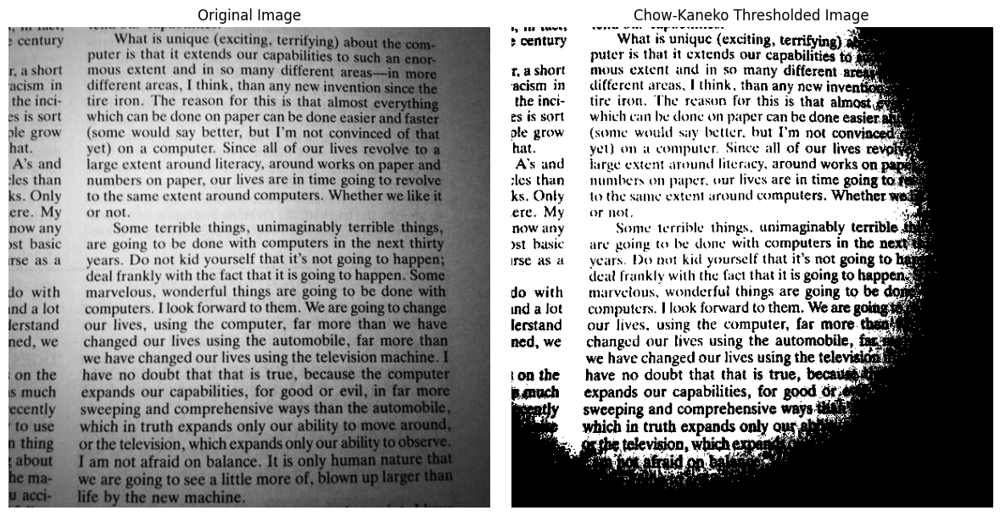

In [207]:
import cv2
import numpy as np

def compute_histogram(image):
    return cv2.calcHist([image], [0], None, [256], [0,256]).flatten()

def chow_kaneko_threshold(hist):
    total_pixels = sum(hist)
    total_intensity = sum([i * hist[i] for i in range(256)])
    
    sumB = 0
    wB = 0
    maximum = 0.0
    threshold = 0
    
    for i in range(256):
        wB += hist[i]
        wF = total_pixels - wB
        if wB == 0 or wF == 0:
            continue
        sumB += i * hist[i]
        mB = sumB / wB
        mF = (total_intensity - sumB) / wF
        between_class_variance = wB * wF * (mB - mF) * (mB - mF)
        if between_class_variance > maximum:
            maximum = between_class_variance
            threshold = i

    return threshold

def apply_threshold(image, threshold):
    return np.where(image > threshold, 255, 0).astype(np.uint8)

if __name__ == "__main__":
    # Load the image in grayscale
    img = cv2.imread('shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)
    
    # Compute the histogram
    hist = compute_histogram(img)
    
    # Compute the threshold using Chow-Kaneko method
    threshold = chow_kaneko_threshold(hist)
    
    # Apply the threshold to get binary output
    binary_img = apply_threshold(img, threshold)
    
    # Display the binary image
    # cv2.imshow('Binary Output', binary_img)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_img, cmap='gray')
plt.title("Chow-Kaneko Thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()





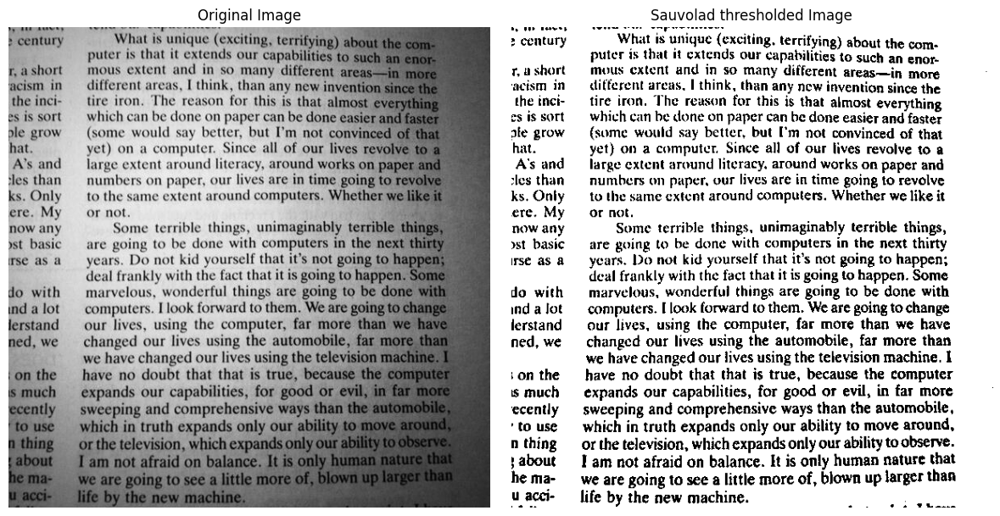

In [206]:
import cv2
import numpy as np
image = cv2.imread('./shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)

def sauvola_threshold(image, window_size=25, k=0.2):
    # Calculate local mean
    mean = cv2.boxFilter(image, ddepth=-1, ksize=(window_size, window_size))

    # Calculate local variance (using E[X^2] - E[X]^2)
    squared = cv2.boxFilter(image**2, ddepth=-1, ksize=(window_size, window_size))
    variance = squared - mean**2
    std_dev = np.sqrt(variance)

    # r is the dynamic range of standard deviation (128 for 8-bit images)
    r = 128
    
    # Calculate threshold
    threshold = mean * (1 + k * (std_dev/r - 1))

    # Apply threshold
    binary_image = np.zeros_like(image, dtype=np.uint8)
    binary_image[image > threshold] = 255

    return binary_image

# Use the method on the image
binary_image = sauvola_threshold(image)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_image, cmap='gray')
plt.title("Sauvolad thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()


# the bigger the window 

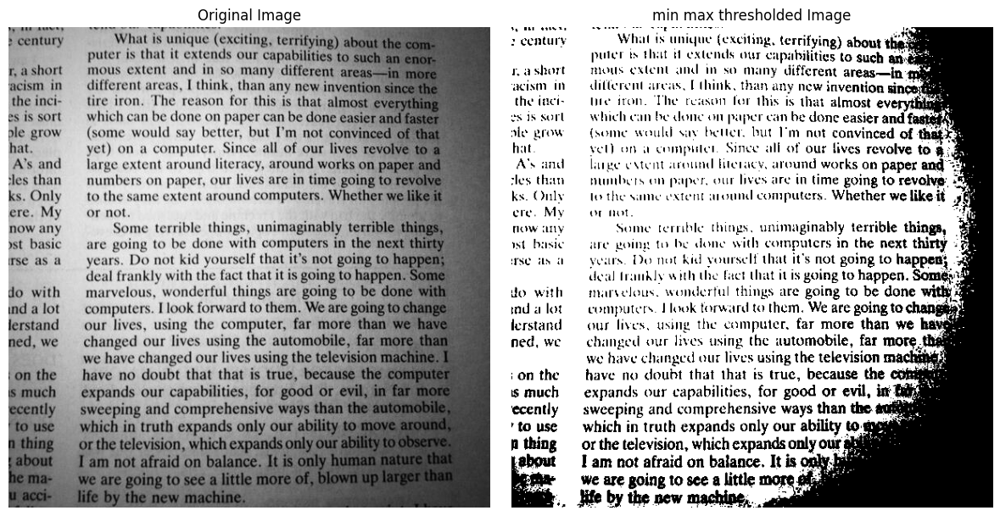

In [205]:
import cv2
import numpy as np
image = cv2.imread('./shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)


def max_min_threshold(image, window_size=20, k=0.2):
    half = window_size // 2
    threshold_image = np.zeros_like(image, dtype=np.uint8)

    # For each pixel, calculate the threshold using the local neighborhood
    for i in range(half, image.shape[0] - half):
        for j in range(half, image.shape[1] - half):
            local = image[i - half:i + half + 1, j - half:j + half + 1]
            mean = np.mean(local)
            maximum = np.max(local)

            # Calculate the threshold
            T = mean - k * (maximum - mean)

            # Apply the threshold
            threshold_image[i, j] = 0 if image[i, j] < T else 255

    return threshold_image

# Apply the thresholding
thresholded = max_min_threshold(filtered_image)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title("min max thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()




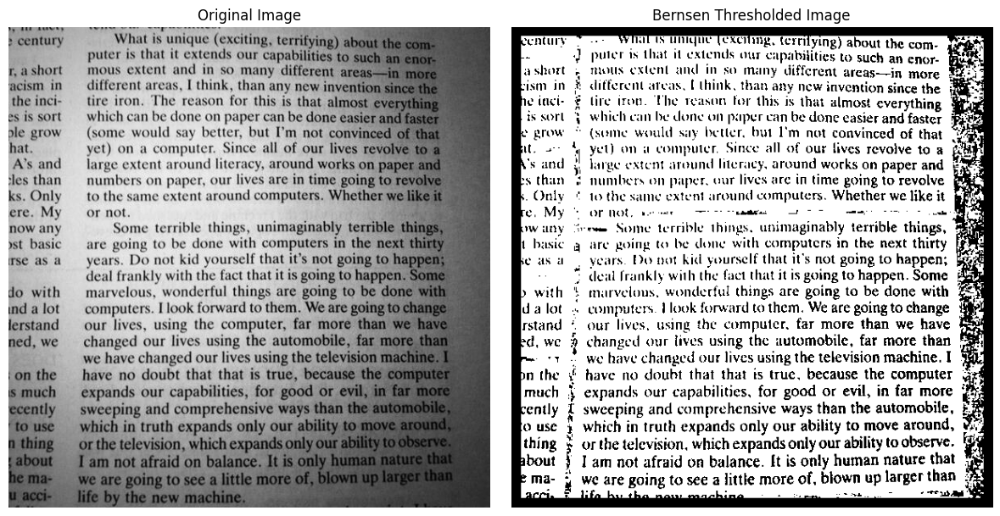

In [199]:
import cv2
import numpy as np

def bernsen_threshold(image, window_size=25, L=5):
    half = window_size // 2
    threshold_image = np.zeros_like(image, dtype=np.uint8)
    GT = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[0]

    # For each pixel, calculate the threshold using the local neighborhood
    for i in range(half, image.shape[0] - half):
        for j in range(half, image.shape[1] - half):
            local = image[i - half:i + half + 1, j - half:j + half + 1]
            Imax = np.max(local)
            Imin = np.min(local)

            # Calculate the threshold
            if Imax - Imin > L:
                T = (int(Imax) + int(Imin)) / 2            
            else:
                T = GT

            # Apply the threshold
            threshold_image[i, j] = 0 if image[i, j] < T else 255

    return threshold_image

# Read image
image = cv2.imread('./shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)
thresholded = bernsen_threshold(image)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(thresholded, cmap='gray')
plt.title("Bernsen Thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()



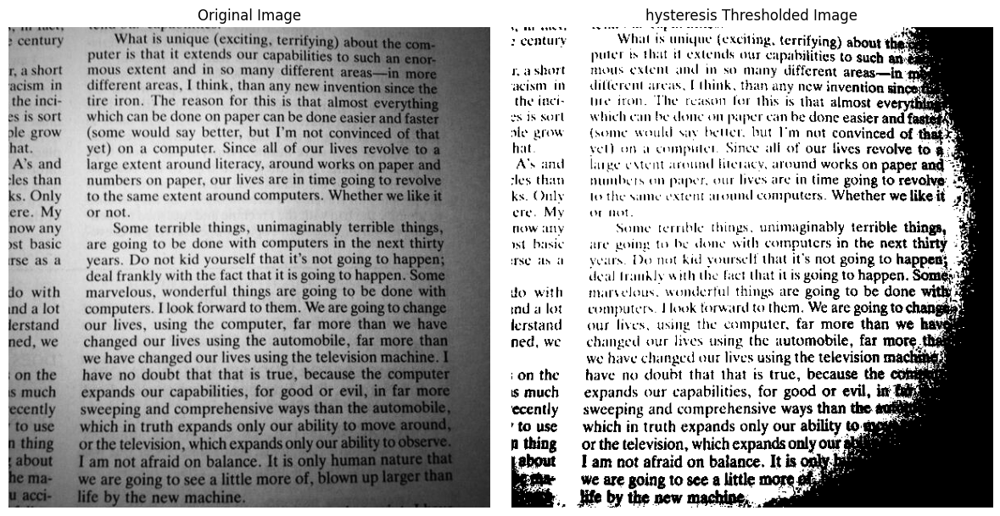

In [189]:
import cv2
import numpy as np

def hysteresis_thresholding(image, low_thresh, high_thresh):
    # Apply initial thresholds
    high_output = np.where(image > high_thresh, 255, 0).astype(np.uint8)
    low_output = np.where((image > low_thresh) & (image <= high_thresh), 255, 0).astype(np.uint8)
    
    # Define kernel for connectivity (3x3 kernel for 8-connectivity)
    kernel = np.ones((3,3), dtype=np.uint8)
    
    # Connected components for weak edges
    _, markers = cv2.connectedComponents(low_output)
    
    # If a connected component of weak edges touches a strong edge, it is set to 255.
    # If not, it is set to 0.
    for marker in range(1, np.max(markers) + 1):
        region = np.where(markers == marker, 1, 0).astype(np.uint8)
        connected = cv2.dilate(region, kernel) & high_output
        
        if np.max(connected) == 255: 
            low_output[markers == marker] = 255
        else:
            low_output[markers == marker] = 0
            
    return high_output | low_output

# Read image in grayscale
image = cv2.imread('./shadowed_text_2.jpg', cv2.IMREAD_GRAYSCALE)

# Apply hysteresis thresholding
result = hysteresis_thresholding(image, 50, 100)



# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title("hysteresis Thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()




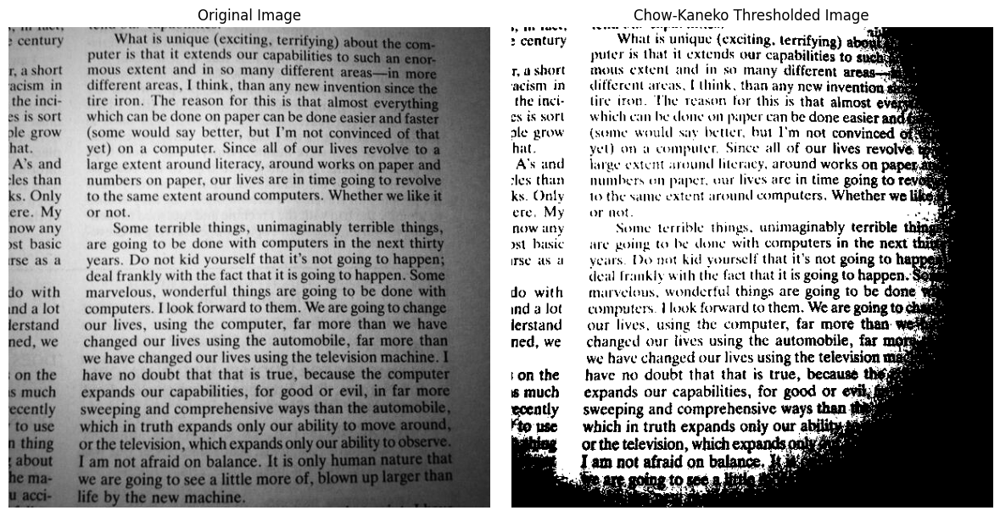

In [188]:
import numpy as np
import matplotlib.pyplot as plt

def chow_kaneko_thresholding(image):
    # 1. Assuming the image is already in digital form
    
    # 2. Logarithmic Transform
    log_image = np.log1p(image.astype(np.float32))
    
    # 3. Compute Histogram for the Entire Region
    histogram, _ = np.histogram(log_image.ravel(), 256, [0,256])
    
    # 4. Compute Local Histograms for 49 regions
    # Assuming the image can be divided into a 7x7 grid
    regions = []
    h, w = image.shape
    h_step, w_step = h // 7, w // 7
    for i in range(7):
        for j in range(7):
            region = log_image[i*h_step:(i+1)*h_step, j*w_step:(j+1)*w_step]
            regions.append(region)
            
    # 5. Determination of Threshold, V0
    V0 = np.mean(log_image)
    
    # Placeholder for region thresholds
    region_thresholds = []
    
    # 6. Iterate for each region
    for region in regions:
        # 6.a. Curve Fitting (Estimation of Parameters)
        param = np.mean(region)
        
        # 6.b. Test for Bimodality
        if np.var(region) > V0:
            threshold = np.mean(region)
            region_thresholds.append(threshold)
        else:
            region_thresholds.append(None)
    
    # 7. Regionwise Interpolation & 8. Pointwise Interpolation
    interpolated_thresholds = np.asarray(region_thresholds).reshape(7,7)
    for i in range(7):
        for j in range(7):
            if interpolated_thresholds[i,j] is None:
                neighbors = []
                if i > 0 and interpolated_thresholds[i-1,j] is not None:
                    neighbors.append(interpolated_thresholds[i-1,j])
                if i < 6 and interpolated_thresholds[i+1,j] is not None:
                    neighbors.append(interpolated_thresholds[i+1,j])
                if j > 0 and interpolated_thresholds[i,j-1] is not None:
                    neighbors.append(interpolated_thresholds[i,j-1])
                if j < 6 and interpolated_thresholds[i,j+1] is not None:
                    neighbors.append(interpolated_thresholds[i,j+1])
                interpolated_thresholds[i,j] = np.nanmean(neighbors) if neighbors else V0
                
    interpolated_thresholds = np.kron(interpolated_thresholds, np.ones((h_step, w_step)))
    
    pad_height = h - interpolated_thresholds.shape[0]
    pad_width = w - interpolated_thresholds.shape[1]
    interpolated_thresholds = np.pad(interpolated_thresholds, ((0, pad_height), (0, pad_width)), mode='edge')
    
    # 9. Binary Decision
    binary_output = np.where(log_image > interpolated_thresholds, 255, 0).astype(np.uint8)
    
    return binary_output

# Load the image (using matplotlib for Jupyter notebooks)
image = plt.imread('./shadowed_text_2.jpg')
if len(image.shape) == 3:  # Convert to grayscale if RGB
    image = np.dot(image[..., :3], [0.2989, 0.5870, 0.1140])

# Run the method
result = chow_kaneko_thresholding(image)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(result, cmap='gray')
plt.title("Chow-Kaneko Thresholded Image")
plt.axis('off')

plt.tight_layout()
plt.show()


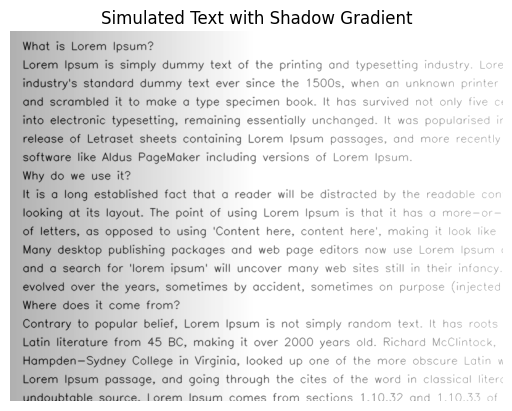

In [184]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Generate a blank image
width, height = 800, 600
image = np.ones((height, width), np.uint8) * 255

# Provided Lorem Ipsum text
texts = [
    "What is Lorem Ipsum?",
    "Lorem Ipsum is simply dummy text of the printing and typesetting industry. Lorem Ipsum has been the",
    "industry's standard dummy text ever since the 1500s, when an unknown printer took a galley of type",
    "and scrambled it to make a type specimen book. It has survived not only five centuries, but also the leap",
    "into electronic typesetting, remaining essentially unchanged. It was popularised in the 1960s with the",
    "release of Letraset sheets containing Lorem Ipsum passages, and more recently with desktop publishing",
    "software like Aldus PageMaker including versions of Lorem Ipsum.",
    "Why do we use it?",
    "It is a long established fact that a reader will be distracted by the readable content of a page when",
    "looking at its layout. The point of using Lorem Ipsum is that it has a more-or-less normal distribution",
    "of letters, as opposed to using 'Content here, content here', making it look like readable English.",
    "Many desktop publishing packages and web page editors now use Lorem Ipsum as their default model text,",
    "and a search for 'lorem ipsum' will uncover many web sites still in their infancy. Various versions have",
    "evolved over the years, sometimes by accident, sometimes on purpose (injected humour and the like).",
    "Where does it come from?",
    "Contrary to popular belief, Lorem Ipsum is not simply random text. It has roots in a piece of classical",
    "Latin literature from 45 BC, making it over 2000 years old. Richard McClintock, a Latin professor at",
    "Hampden-Sydney College in Virginia, looked up one of the more obscure Latin words, consectetur, from a",
    "Lorem Ipsum passage, and going through the cites of the word in classical literature, discovered the",
    "undoubtable source. Lorem Ipsum comes from sections 1.10.32 and 1.10.33 of 'de Finibus Bonorum et Malorum'",
    "(The Extremes of Good and Evil) by Cicero, written in 45 BC. This book is a treatise on the theory of ethics,",
    "very popular"
]

font = cv2.FONT_HERSHEY_SIMPLEX
y0, dy = 30, 30  # Adjusted the starting position and line spacing for better fit
for i, line in enumerate(texts):
    y = y0 + i * dy
    cv2.putText(image, line, (20, y), font, 0.6, 0, 1, lineType=cv2.LINE_AA)

# Create a linear gradient for shadow effect from the left side
linear_gradient = np.tile(np.linspace(0, 255, width, dtype=np.uint8), (height, 1))
image = cv2.addWeighted(image, 0.7, linear_gradient, 0.6, 0.6)  # Blend the original image with the gradient




# Display the image using matplotlib
plt.imshow(image, cmap='gray')
plt.axis('off')  # Hide axes
plt.title('Simulated Text with Shadow Gradient')
plt.show()



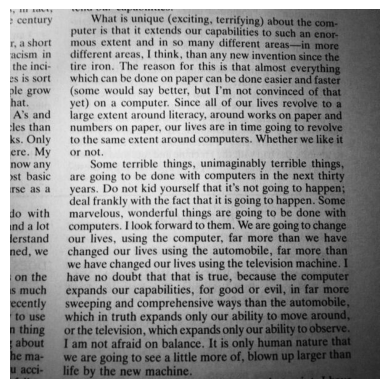

In [187]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = "./shadowed_text_2.jpg" # Replace with your image path
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Dimensions
height, width = image.shape

# Create shadow gradient
y_indices, x_indices = np.ogrid[:height, :width]
shadow_gradient = 255 - np.clip(1.5 * x_indices + 1.5 * y_indices, 0, 255).astype(image.dtype) # Convert to the same type as image

# Apply shadow
shadowed_image = cv2.addWeighted(image, 0.8, shadow_gradient, 0.2, 0)

# Display the shadowed image using matplotlib
plt.imshow(shadowed_image, cmap='gray')
plt.axis('off')
plt.show()
